Implémentation de l'algorithme DDPG : variation de l'algorithme actor-critic. Au lieu d'utiliser une politique epsilon-greedy, on utilise un bruit brownien pour faire l'exploration (https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process).

Ici, nous avons aussi tenté de faire tourner l'algorithme sur notre environnement customisé (Acrobot avec espace d'actions continu).

In [11]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_docs.vis.embed as embed
from functools import partial
from datetime import datetime

from buffer import Buffer
from models import get_actor, get_critic, update_target
from noise import OUActionNoise
from policies import policy_noise, policy_epsilon_greedy

import sys
from pathlib import Path
sys.path.append(Path(sys.path[0]).parent.parent.as_posix())
from environments.custom_acrobot import CustomAcrobot

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
##########                               ############
#########   Création de l'environnement ############
#########                               ############

def terminal_func(theta1_expected, theta2_expected, var, state):
    return all((
        np.abs(state[0] - theta1_expected) < var,
        np.abs(state[1] - theta2_expected) < var,
        # np.abs(state[2]) < .25,
        # np.abs(state[3]) < .25,
    ))


problem = "Pendulum-v1"
# env = gym.make(problem)
theta2_expected_degrees = 45
theta2_expected = theta2_expected_degrees * np.pi / 180
m1 = 1
m2 = 1
l1 = 1
l2 = 1
g = 9.8
alpha = -(m1*l1 + m2*l2)*g
beta = - m2*l2*g
theta1_expected = np.arctan(beta * np.sin(theta2_expected) / (alpha + beta * np.cos(theta2_expected)))

env = CustomAcrobot(continuous_actions=True,
                    terminal_func=partial(terminal_func, theta1_expected, theta2_expected, .09))

num_states = env.observation_space.shape[0]
print("Size of State Space ->  {}".format(num_states))
num_actions = env.action_space.shape[0]
print("Size of Action Space ->  {}".format(num_actions))

upper_bound = env.action_space.high[0]
lower_bound = env.action_space.low[0]

print("Max Value of Action ->  {}".format(upper_bound))
print("Min Value of Action ->  {}".format(lower_bound))

print(f"Expected state theta -> ({theta1_expected * 180 / np.pi:.2f}º, {theta2_expected_degrees:.2f}º)")

Size of State Space ->  6
Size of Action Space ->  1
Max Value of Action ->  1.0
Min Value of Action ->  -1.0
Expected state theta -> (14.64º, 45.00º)


In [3]:
### DEFINITION DES PARAMETRES

std_dev = 0.2
ou_noise = OUActionNoise(mean=np.zeros(1), std_deviation=float(std_dev) * np.ones(1))

actor_model = get_actor(num_states)
critic_model = get_critic(num_states, num_actions)

target_actor = get_actor(num_states)
target_critic = get_critic(num_states, num_actions)

# Making the weights equal initially
target_actor.set_weights(actor_model.get_weights())
target_critic.set_weights(critic_model.get_weights())

# Learning rate for actor-critic models
critic_lr = 0.002
actor_lr = 0.001

critic_optimizer = tf.keras.optimizers.Adam(critic_lr)
actor_optimizer = tf.keras.optimizers.Adam(actor_lr)

total_episodes = 200
# Discount factor for future rewards
gamma = 0.99
# Used to update target networks
tau = 0.005

#Epsilon greedy
epsilon = 0.05

buffer = Buffer(num_states, num_actions, target_actor, actor_model,
                actor_optimizer, target_critic, critic_model,
                critic_optimizer, 50000, 64)


/Users/gustavo/miniconda3/lib/python3.10/random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)


2023-03-07 15:48:25.730550: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Episode * 0 * Avg Reward is ==> -1000.0
Episode * 1 * Avg Reward is ==> -1000.0
Episode * 2 * Avg Reward is ==> -1000.0
Episode * 3 * Avg Reward is ==> -849.5
Episode * 4 * Avg Reward is ==> -879.6
Episode * 5 * Avg Reward is ==> -766.0
Episode * 6 * Avg Reward is ==> -665.2857142857143
Episode * 7 * Avg Reward is ==> -584.25
Episode * 8 * Avg Reward is ==> -543.0
Episode * 9 * Avg Reward is ==> -588.7
Episode * 10 * Avg Reward is ==> -626.0909090909091
Episode * 11 * Avg Reward is ==> -575.5
Episode * 12 * Avg Reward is ==> -608.1538461538462
Episode * 13 * Avg Reward is ==> -564.7857142857143
Episode * 14 * Avg Reward is ==> -527.5333333333333
Episode * 15 * Avg Reward is ==> -557.0625
Episode * 16 * Avg Reward is ==> -583.1176470588235
Episode * 17 * Avg Reward is ==> -554.7222222222222
Episode * 18 * Avg Reward is ==> -578.1578947368421
Episode * 19 * Avg Reward is ==> -599.25
Episode * 20 * Avg Reward is ==> -618.3333333333334
Episode * 21 * Avg Reward is ==> -591.4545454545455
Ep

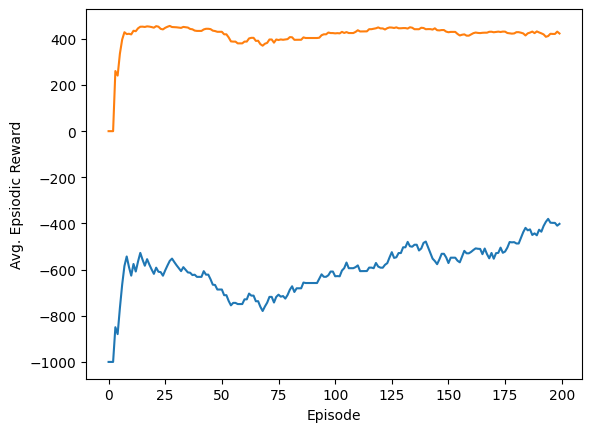

In [4]:
### BOUCLE D'ENTRAINEMENT

# To store reward history of each episode
reward_list = []
# To store average reward history of last few episodes
reward_avg_list = []
reward_std_list = []

max_episode_length = 1000

rng = np.random.default_rng(42)
seeds = rng.integers(1, 1_000, total_episodes)

for ep, seed in enumerate(seeds):

    prev_state, _ = env.reset(seed=int(seed),
                              options={
                                  'low': -np.pi / 4,
                                  'high': np.pi / 4
                              })
    episodic_reward = 0
    nb_actions = 0

    #print(prev_state)

    while True:
        # Uncomment this to see the Actor in action
        # But not in a python notebook.
        # env.render()

        #print('DANS LA BOUCLEEEEEEE')

        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)

        #action = policy(tf_prev_state, ou_noise)
        action = policy_epsilon_greedy(tf_prev_state, epsilon, actor_model)
        #print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
        #print(action)
        #print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
        # Recieve state and reward from environment.
        # print(prev_state)
        state, reward, done, *_= env.step(action)
        nb_actions += 1

        buffer.record((prev_state, action, reward, state))
        episodic_reward += reward

        buffer.learn(gamma)
        update_target(target_actor.variables, actor_model.variables, tau)
        update_target(target_critic.variables, critic_model.variables, tau)

        # End this episode when `done` is True
        if done or nb_actions >= max_episode_length:
            break

        prev_state = state

    reward_list.append(episodic_reward)

    # Mean of last 40 episodes
    reward_avg = np.mean(reward_list[-40:])
    reward_std = np.std(reward_list[-40:])
    print("Episode * {} * Avg Reward is ==> {}".format(ep, reward_avg))
    reward_avg_list.append(reward_avg)
    reward_std_list.append(reward_std)

    if reward_std / max_episode_length < .05 and ep > .5 * total_episodes:
        break

# Plotting graph
# Episodes versus Avg. Rewards
plt.plot(reward_avg_list)
plt.plot(reward_std_list)
plt.xlabel("Episode")
plt.ylabel("Avg. Epsiodic Reward")
plt.show()

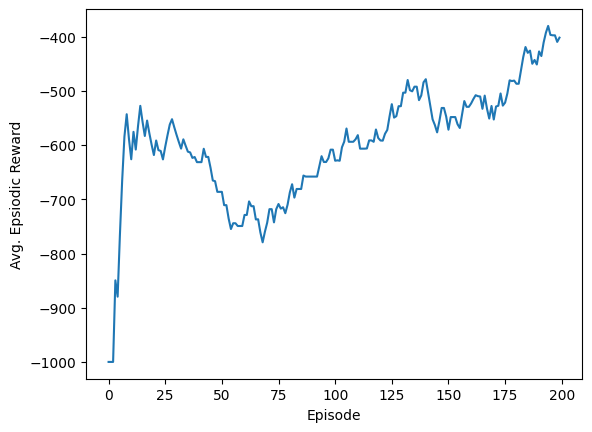

In [5]:
# ON PLOT LES RECOMPENSES A CHAQUE EPISODE

# Plotting graph
# Episodes versus Avg. Rewards
plt.plot(reward_avg_list)
plt.xlabel("Episode")
plt.ylabel("Avg. Epsiodic Reward")
plt.show()

PosixPath('run_20230307_160516')

In [16]:
# ON SAUVEGARDE LES POIDS
path = Path(f"./run_{datetime.now().strftime('%Y%m%d_%H%M%S')}")
path.mkdir(exist_ok=True)

actor_model.save_weights(path / "actor_main.h5")
critic_model.save_weights(path / "critic_main.h5")

target_actor.save_weights(path / "actor_target.h5")
target_critic.save_weights(path / "critic_target.h5")

env.save(path / "env.pickle")

Saved environment to /Users/gustavo/Documents/IMTA/3A/procom/git_repo/src/python/models/DDPG/run_20230307_161707/env.pickle


In [7]:
# Let's test our agent

for ep in range(1):

    prev_state, _ = env.reset()
    episodic_reward = 0
    nbetapes = 0

    while True:

        nbetapes+=1

        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)

        action = policy_noise(tf_prev_state, ou_noise, actor_model, lower_bound, upper_bound)
        # Recieve state and reward from environment.
        state, reward, done, *_ = env.step(action)

        # End this episode when `done` is True
        if done:
            print(nbetapes)
            break

        prev_state = state

1325


In [8]:
# Render an episode and save as a GIF file

from IPython import display as ipythondisplay
from PIL import Image

render_env = CustomAcrobot(continuous_actions=True, render_mode='rgb_array')

def render_episode(env: gym.Env, model: tf.keras.Model, max_steps: int):
    state, _ = env.reset()
    state = tf.constant(state, dtype=tf.float32)
    screen = env.render()
    images = [Image.fromarray(screen)]
    states = []
    actions = []
    rewards = []

    for i in range(1, max_steps + 1):
        state = tf.expand_dims(state, 0)
        states.append(np.squeeze(state[0]))
        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)

        action = model(state)
        actions.append(action)

        state, reward, done, truncated, info = env.step(action)
        state = tf.constant(state, dtype=tf.float32)

        rewards.append(reward)

        # Render screen every 10 steps
        if i % 2 == 0:
            screen = env.render()
            images.append(Image.fromarray(screen))

        # if done:
        #     break

    return images, np.array(states), np.array(actions), np.array(rewards)


# Save GIF image
images, states, actions, rewards = render_episode(render_env, actor_model, 10_000)
image_file = 'custom_acrobot_ddpg.gif'
# loop=0: loop forever, duration=1: play each frame for 1ms
images[0].save(image_file,
               save_all=True,
               append_images=images[1:],
               loop=0,
               duration=1)



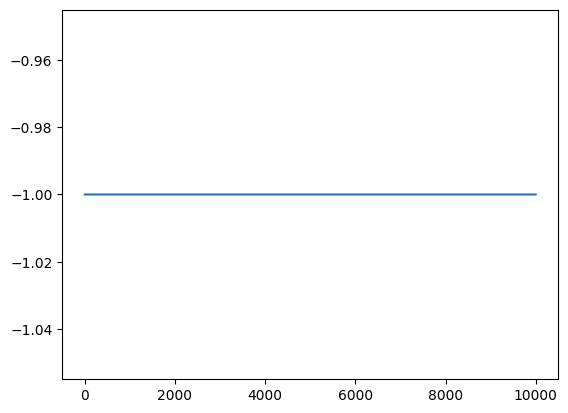


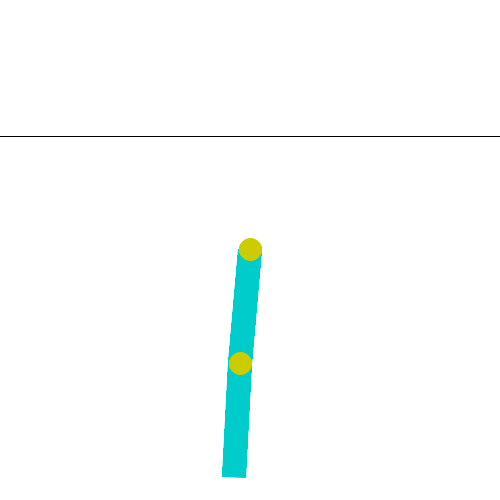

In [9]:
plt.plot(rewards)
plt.show()
embed.embed_file(image_file)